In [1]:
import tensorflow as tf
from tensorflow.keras import layers, Model, Input

import cv2

import pandas as pd
import numpy as np 

import matplotlib.pyplot as plt

import os 
from pathlib import Path


#### Project 1-1

In [10]:
# 이미지 로드 
hr_image_path = os.getcwd() + '/hr_image3.jpg'
hr_img = cv2.imread(hr_image_path, cv2.IMREAD_COLOR)

# color RGB
b,g,r = cv2.split(hr_img)
hr_img = cv2.merge([r,g,b])

In [11]:
# 고해상도 to Pixel/4
bicubic_hr = cv2.resize(hr_img, dsize = (hr_img.shape[1]//4, hr_img.shape[0]//4), 
                        interpolation = cv2.INTER_CUBIC)

print(hr_img.shape, bicubic_hr.shape)

(420, 840, 3) (105, 210, 3)


In [6]:
# # 고해상도 to Pixel/4


# def preprocessing(hr):
#     hr = tf.cast(hr, tf.float32)/255. 
#     bicubic_hr = tf.image.resize(hr, [hr_img.shape[0]//4, hr_img.shape[1]//4], 'bicubic')
#     return hr, bicubic_hr

# hr_img, bicubic_hr = preprocessing(hr_img)


In [12]:
type(bicubic_hr)

numpy.ndarray

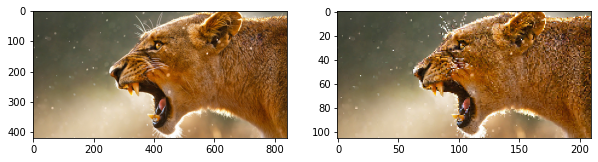

In [13]:
# HR & LR Image show
plt.figure(figsize = (10, 8))
plt.subplot(121)
plt.imshow(hr_img) # raw high resolution
plt.subplot(122)
plt.imshow(bicubic_hr) # low resolution 

In [14]:
print(bicubic_hr.shape, hr_img.shape)

(105, 210, 3) (420, 840, 3)


In [15]:
# LR 이미지(bicubic_hr) to HR using SRGAN
# 이미 학습이 완료된 SRGAN을 이용 
# bicubic_hr 이미지 to high resolution image

model_file = os.getcwd() + '/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]


# bicubic_hr = bicubic_hr.batch(8)
# train = train.map(preprocessing).shuffle(buffer_size = 10).repeat().batch(8)

srgan_lr_to_hr = apply_srgan(bicubic_hr)


In [16]:
##### bicubic_hr 이미지 to 픽셀 크기 원래대로 (x4)
bicubic_resize = cv2.resize(bicubic_hr, dsize = (bicubic_hr.shape[1]*4, bicubic_hr.shape[0]*4),
                                                  interpolation=cv2.INTER_CUBIC)

print(hr_img.shape, bicubic_resize.shape) #원래 이미지 vs down then up size

(420, 840, 3) (420, 840, 3)


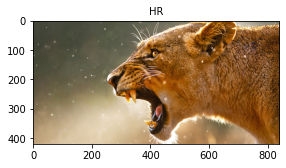

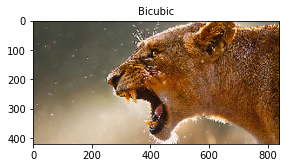

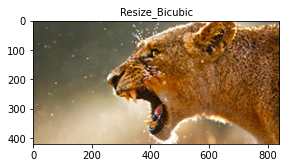

In [17]:
images = [hr_img, srgan_lr_to_hr, bicubic_resize]
labels = ['HR', 'Bicubic', 'Resize_Bicubic']

for i, (image, label) in enumerate(zip(images, labels)):
    plt.figure(figsize = (15, 15))
    plt.subplot(1, 3, i+1)
    plt.imshow(image)
    plt.title(label, fontsize = 10)

# 어떤 결과를 갖는지 잘 보이지 않아서 crop 하여 보고자 함 

In [34]:
left_tops = [(50,100), (120, 150), (0, 140)]

def crop(image, left_top, x = 200, y = 200):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

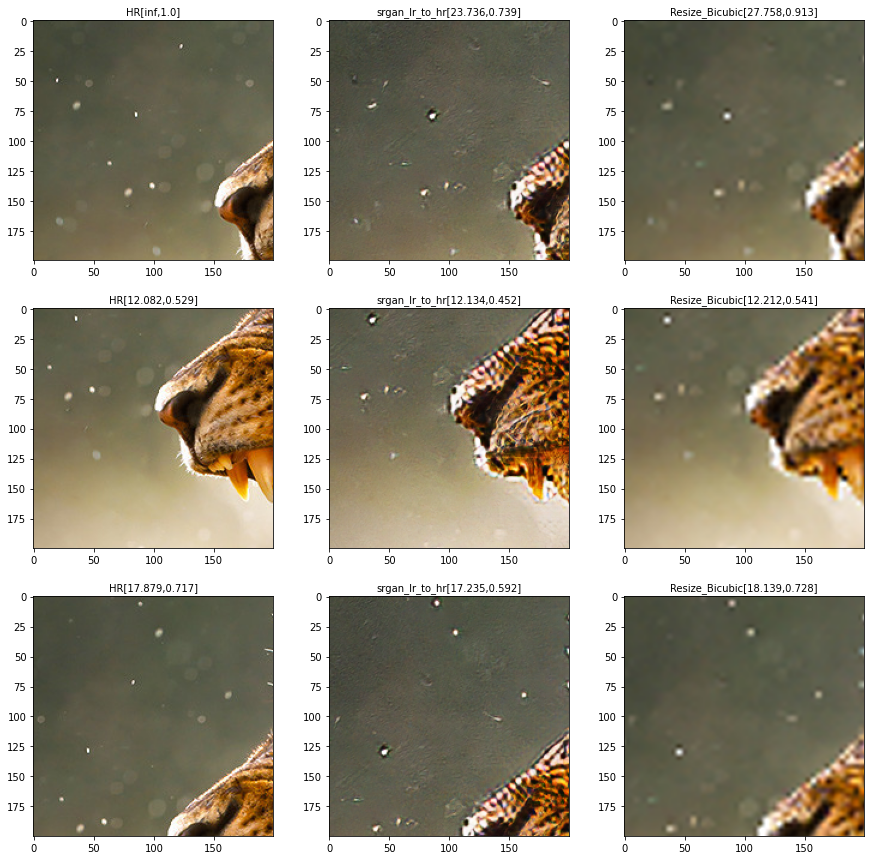

In [36]:
# 일부 crop 

images = []
for left_top in left_tops:
    img1 = crop(hr_img, left_top, 200, 200)
    img2 = crop(srgan_lr_to_hr, left_top, 200, 200)
    img3 = crop(bicubic_resize, left_top, 200, 200)
    images.extend([img1, img2, img3])


labels = ['HR', 'srgan_lr_to_hr', 'Resize_Bicubic'] *3

# 비교값 확인
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
# psnr = [round(peak_signal_noise_ratio(hr_img, i), 3) for i in images]
# ssim = [round(structural_similarity(hr_img, i, multichannel=True), 3) for i in images]

plt.figure(figsize = (15, 15))
for i in range(9):
    plt.subplot(3, 3, i+1)
    psnr = round(peak_signal_noise_ratio(images[0], images[i]), 3)
    ssim = round(structural_similarity(images[0], images[i], multichannel=True), 3)
    plt.imshow(images[i])
    plt.title(labels[i] + f'[{psnr},{ssim}]', fontsize = 10)


- srgan_lr_to_hr보다 Resize_Ricubic이 raw image와 더 높은 유사율을 보임 
- crop된 이미지를 보면 srgan으로 만들어진 이미지가 조금 더 또렷하긴 하나, noise가 그만큼 있기 때문에 이러한 결과가 나오지 않았을까 라고 생각됨

#### SRGAN gif image
- 이미 존재하는 gif file 이용하여 픽셀을 4배로 늘인 후 gif 다시 생성 

In [37]:
import cv2

gif = cv2.VideoCapture("/aiffel/aiffel/srcnn/city_night_lr.gif")

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 8
frame 크기 : (255, 500, 3)


In [38]:
# bicubic & srgan 이용해서 픽셀 4배로 늘이기 
frames_sr= []

for frame in frames:
    a = cv2.resize(frame, dsize = (frame.shape[1]*4, frame.shape[0]*4), interpolation = cv2.INTER_CUBIC)
    frames_sr.append(a)
    
len(frames_sr)

8

In [39]:
import imageio

imageio.mimsave("/aiffel/aiffel/srcnn/city_night_lr_m.gif", frames_sr)

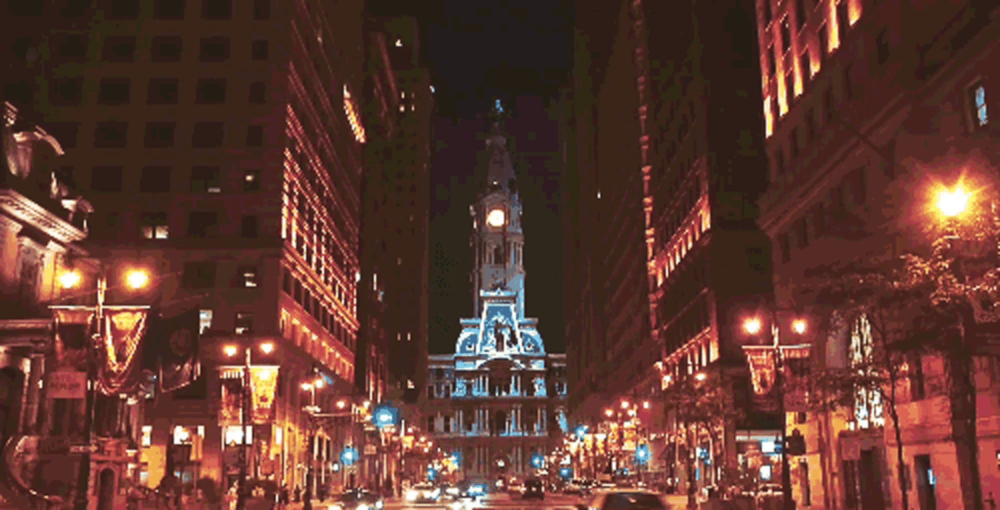

In [40]:
from IPython.display import Image as show_gif

show_gif("/aiffel/aiffel/srcnn/city_night_lr_m.gif", width=800) 

In [ ]:
#### 회고 
- 이미지가 너무 크면 srgan이 진행되지 않는 오류가 일어남. 해당 부분 해결 방안 찾아야 함 
- package 간 충돌이 일어남. (.h5 이용할 때) _ python 버전간 충돌 없이 해결할 수 있는법 찾아야 함 
- srgan이 무조건 좋은 결과를 얻지는 않는다는 것을 인지하고, 상황에 따라 그 이유가 무엇인지 확인해야 할 것 같음 